In [1]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
nltk.download("stopwords")
import string 
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
# for other theme, please run: mpl.pyplot.style.available
PLOT_PALETTE = 'tableau-colorblind10'
# for other color map, please run: mpl.pyplot.colormaps()
WORDCLOUD_COLOR_MAP = 'tab10_r'

# set palette color
plt.style.use(PLOT_PALETTE)
%matplotlib inline

In [4]:
df = pd.read_csv('C:Users/rahul/Desktop/Sem 3/606/Resume.csv/Resume.csv')
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   ID           2484 non-null   int64 
 1   Resume_str   2484 non-null   object
 2   Resume_html  2484 non-null   object
 3   Category     2484 non-null   object
dtypes: int64(1), object(3)
memory usage: 77.8+ KB


In [5]:
# drop unused columns
df.pop('ID')
df.pop('Resume_html')
df

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR
...,...,...
2479,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,AVIATION
2480,"GOVERNMENT RELATIONS, COMMUNICATIONS ...",AVIATION
2481,GEEK SQUAD AGENT Professional...,AVIATION
2482,PROGRAM DIRECTOR / OFFICE MANAGER ...,AVIATION


In [6]:
#Before Cleaning the resume
df["Resume_str"][1]

"         HR SPECIALIST, US HR OPERATIONS       Summary     Versatile  media professional with background in Communications, Marketing, Human Resources and Technology.\xa0        Experience     09/2015   to   Current     HR Specialist, US HR Operations    Company Name   －   City  ,   State       Managed communication regarding launch of Operations group, policy changes and system outages      Designed standard work and job aids to create comprehensive training program for new employees and contractors         Audited job postings for old, pending, on-hold and draft positions.           Audited union hourly, non-union hourly and salary background checks and drug screens             Conducted monthly new hire benefits briefing to new employees across all business units               Served as a link between HR Managers and vendors by handling questions and resolving system-related issues         Provide real-time process improvement feedback on key metrics and initiatives  Successfully r

# Preprocessing

In [7]:
stemmer = nltk.stem.porter.PorterStemmer()

In [8]:
def preprocess(text):
    # Convert text to lowercase
    text = text.lower()
    
    # Remove non-english characters, punctuation, and numbers
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Tokenize words
    words = word_tokenize(text)
    
    # Remove stop words and apply stemming
    words = [stemmer.stem(word) for word in words if word not in stopwords.words('english')]
    
    # Additional cleaning steps
    text = ' '.join(words)
     # Remove punctuations, mentions, hashtags, RT and cc,  Remove URLs
    text = re.sub('http\S+\s*|RT|cc|#\S+|@\S+|[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', text)
    text = re.sub(r'[^\x00-\x7f]', ' ', text)   # Remove non-ASCII characters
    text = re.sub('\s+', ' ', text)  # Remove extra whitespace
    
    return text.strip()


In [9]:
# preprocessing text
df['Resume'] = df['Resume_str'].apply(lambda w: preprocess(w))
# drop original text column
df.pop('Resume_str')
df

,Category,Resume
0,HR,hr administr market associ hr administr summar...
1,HR,hr specialist us hr oper summari versatil medi...
2,HR,hr director summari year experi recruit plu ye...
3,HR,hr specialist summari dedic driven dynam year ...
4,HR,hr manag skill highlight hr skill hr depart st...
...,...,...
2479,AVIATION,rank sgt e non commiss offic charg brigad mail...
2480,AVIATION,govern relat commun organiz develop director p...
2481,AVIATION,geek squad agent profession profil support spe...
2482,AVIATION,program director offic manag summari highli pe...


In [10]:
#After Cleaning the resume text
df["Resume"][1]

'hr specialist us hr oper summari versatil media profession background commun market human resourc technolog experi current hr specialist us hr oper compani name citi state manag commun regard launch oper group polici chang system outag design standard work job aid creat comprehens train program new employe contractor audit job post old pend hold draft posit audit union hourli non union hourli salari background check drug screen conduct monthli new hire benefit brief new employe across busi unit serv link hr manag vendor handl question resolv system relat issu provid real time process improv feedback key metric initi su ess brand us hr oper sharepoint site busi unit project manag rfi rfp background check drug screen vendor market commun co op compani name citi state post new articl chang updat corpor sharepoint site includ graphic visual commun research draft articl featur stori promot compani activ program co edit develop content quarterli publish newslett provid commun support intern

# Exploratory Data Analysis

In [13]:
# create list of all categories
categories = np.sort(df['Category'].unique())
categories

array(['ACCOUNTANT', 'ADVOCATE', 'AGRICULTURE', 'APPAREL', 'ARTS',
       'AUTOMOBILE', 'AVIATION', 'BANKING', 'BPO', 'BUSINESS-DEVELOPMENT',
       'CHEF', 'CONSTRUCTION', 'CONSULTANT', 'DESIGNER', 'DIGITAL-MEDIA',
       'ENGINEERING', 'FINANCE', 'FITNESS', 'HEALTHCARE', 'HR',
       'INFORMATION-TECHNOLOGY', 'PUBLIC-RELATIONS', 'SALES', 'TEACHER'],
      dtype=object)

In [14]:
df_categories = [df[df['Category'] == category].loc[:, ['Resume', 'Category']] for category in categories]
df_categories[10]

,Resume,Category
1357,chef career focu nurs student recent obtain cn...,CHEF
1358,chef summari custom orient fast food worker de...,CHEF
1359,chef career overview dedic custom servic repre...,CHEF
1360,chef summari experienc cater chef skill prepar...,CHEF
1361,rm roxann mejia summari motiv chef compet keep...,CHEF
...,...,...
1470,owner chef summari chef year critic a laim wor...,CHEF
1471,kindergarten teacher profession summari energe...,CHEF
1472,substitut para profession summari profession m...,CHEF
1473,execut chef partner summari proven abil fine d...,CHEF


Distribution of Resume Categories

(array([], dtype=float64), [])

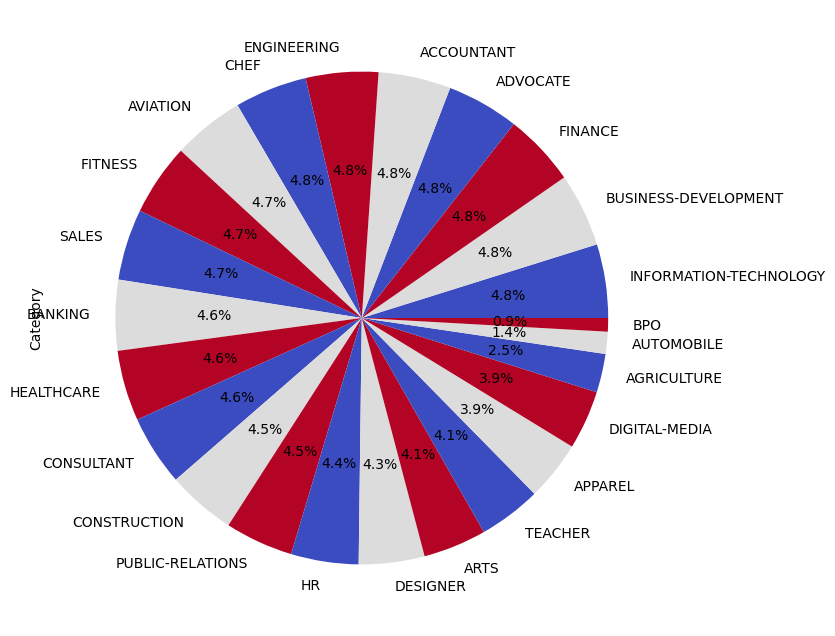

In [15]:
plt.figure(figsize=(8,8))
df['Category'].value_counts().plot(kind='pie',autopct='%1.1f%%',colors=plt.cm.coolwarm(np.linspace(0,1,3)))
plt.xticks(rotation=90)

In [16]:
df['Category'].value_counts()

INFORMATION-TECHNOLOGY    120
BUSINESS-DEVELOPMENT      120
FINANCE                   118
ADVOCATE                  118
ACCOUNTANT                118
ENGINEERING               118
CHEF                      118
AVIATION                  117
FITNESS                   117
SALES                     116
BANKING                   115
HEALTHCARE                115
CONSULTANT                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: Category, dtype: int64

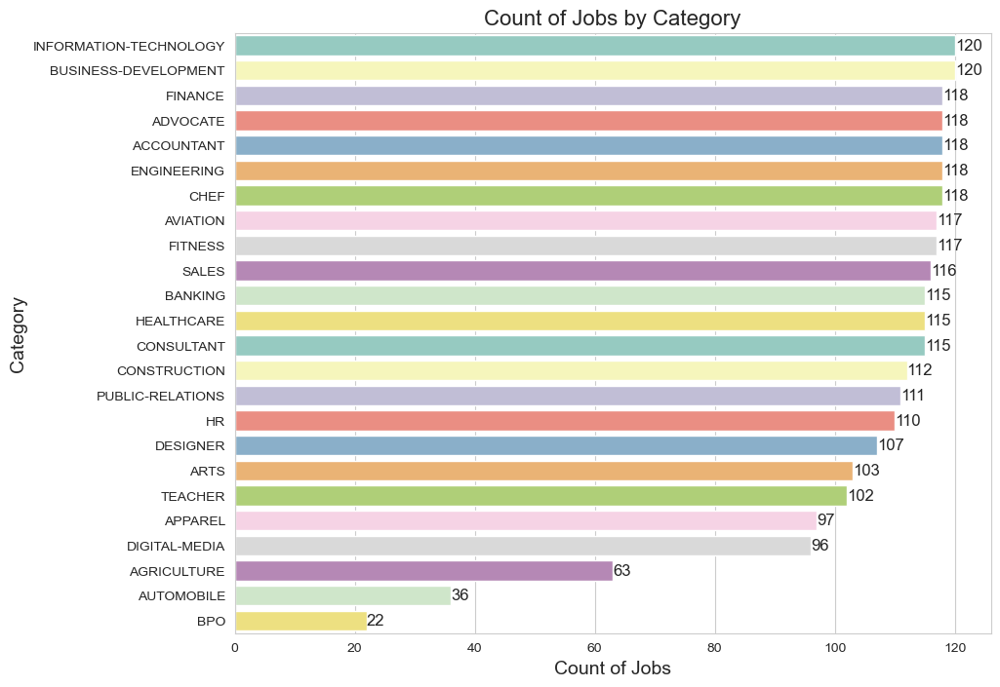

In [17]:
# Calculate category counts
df_category_counts = df['Category'].value_counts().reset_index()
df_category_counts.columns = ['Category', 'Count']

# Set the style
sns.set_style("whitegrid")

# Create a figure and axis objects
plt.figure(figsize=(10, 8))

# Plot a horizontal bar chart
sns.barplot(x="Count", y="Category", data=df_category_counts, palette="Set3")

# Add labels and title
plt.xlabel("Count of Jobs", fontsize=14)
plt.ylabel("Category", fontsize=14)
plt.title("Count of Jobs by Category", fontsize=16)

# Add annotations
for index, value in enumerate(df_category_counts["Count"]):
    plt.text(value, index, str(value), fontsize=12, verticalalignment='center')

# Show plot
plt.show()


In [18]:
def wordcloud(df):
    txt = ' '.join(txt for txt in df['Resume'])
    wordcloud = WordCloud(
        height=2000,
        width=4000,
        colormap=WORDCLOUD_COLOR_MAP
    ).generate(txt)

    return wordcloud

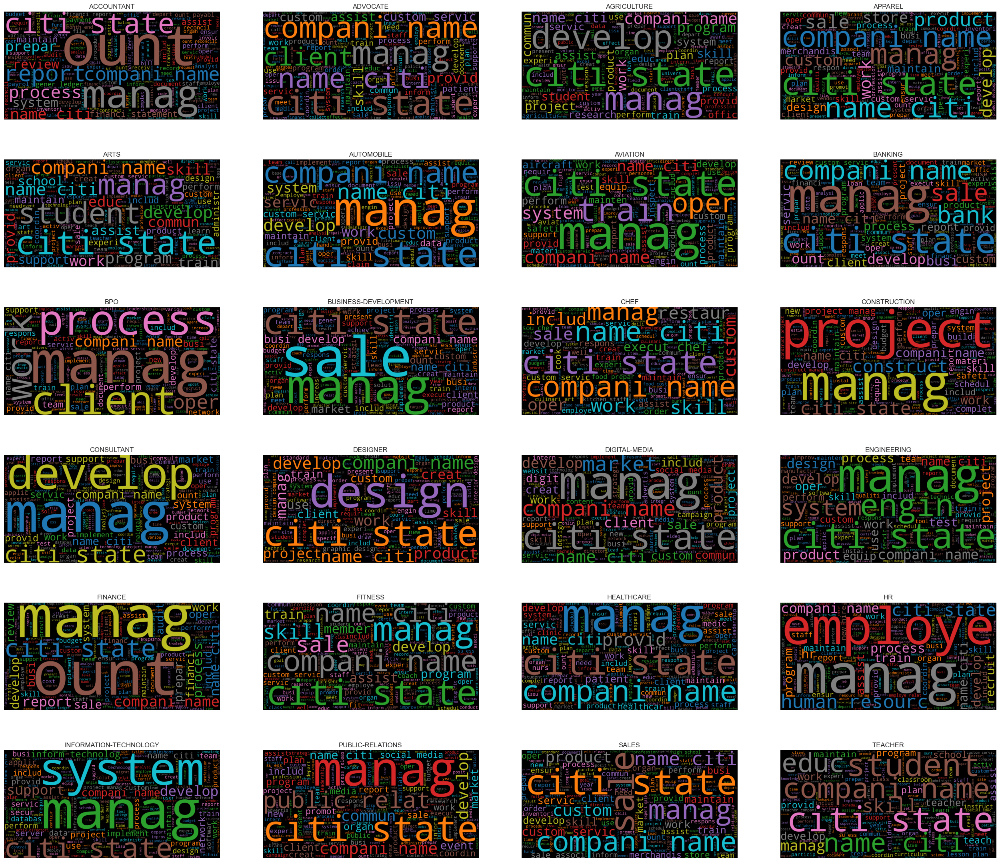

In [19]:
plt.figure(figsize=(32, 28))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(6, 4, i + 1).set_title(category)
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

In [20]:
del_words = ['name', 'city', 'state', 'country', 'fullname', 'company', 'resume', 'curriculum vitae', 'address', 'phone',
             'email', 'linkedin', 'profile', 'summary', 'objective', 'experience', 'education', 'skill', 'skills',
             'reference', 'references', 'contact', 'detail', 'details', 'mail', 'gmail', 'yahoo', 'hotmail', 'mailing',
             'linkedin', 'twitter', 'facebook', 'instagram', 'website', 'web', 'url', 'www', 'year']

In [21]:
stop_words = set(stopwords.words('english')+['``',"''"]+del_words)
total_words = []
sentences = df['Resume'].values
cleaned_sentences = ""
for sentence in sentences:
    cleaned_sentences += sentence
    required_words = nltk.word_tokenize(sentence)
    for word in required_words:
        if word not in stop_words and word not in string.punctuation:
            total_words.append(word)

In [22]:
word_freq_fist = nltk.FreqDist(total_words)
most_freq = word_freq_fist.most_common(50)
print(most_freq)

[('manag', 24408), ('compani', 15723), ('citi', 15128), ('develop', 12127), ('custom', 11777), ('servic', 9241), ('work', 8875), ('ount', 8666), ('sale', 8553), ('busi', 8175), ('project', 8073), ('product', 7516), ('train', 7284), ('system', 7266), ('team', 7156), ('process', 6916), ('commun', 6893), ('plan', 6524), ('client', 6516), ('new', 6410), ('market', 6253), ('report', 6206), ('provid', 6169), ('oper', 6152), ('includ', 6129), ('design', 6102), ('assist', 6066), ('maintain', 6005), ('experi', 5853), ('program', 5562), ('perform', 5441), ('support', 5147), ('offic', 5125), ('educ', 5111), ('inform', 4885), ('prepar', 4594), ('use', 4470), ('implement', 4436), ('respons', 4393), ('employe', 4391), ('profession', 4384), ('financi', 4363), ('administr', 4015), ('staff', 3977), ('time', 3968), ('creat', 3967), ('ensur', 3939), ('excel', 3817), ('data', 3797), ('organ', 3766)]


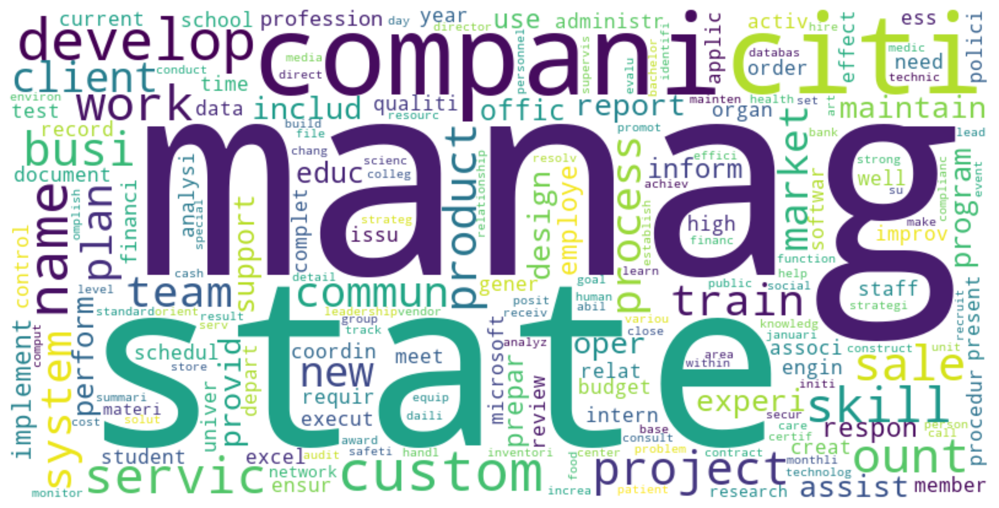

In [23]:
wc = WordCloud(collocations=False, width=800, height=400, background_color='white').generate(cleaned_sentences)
plt.figure(figsize=(12,6), dpi=300)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()

In [24]:
def wordfreq(df):
    count = df['Resume'].str.split(expand=True).stack().value_counts().reset_index()
    count.columns = ['Word', 'Frequency']
    return count.head(10)

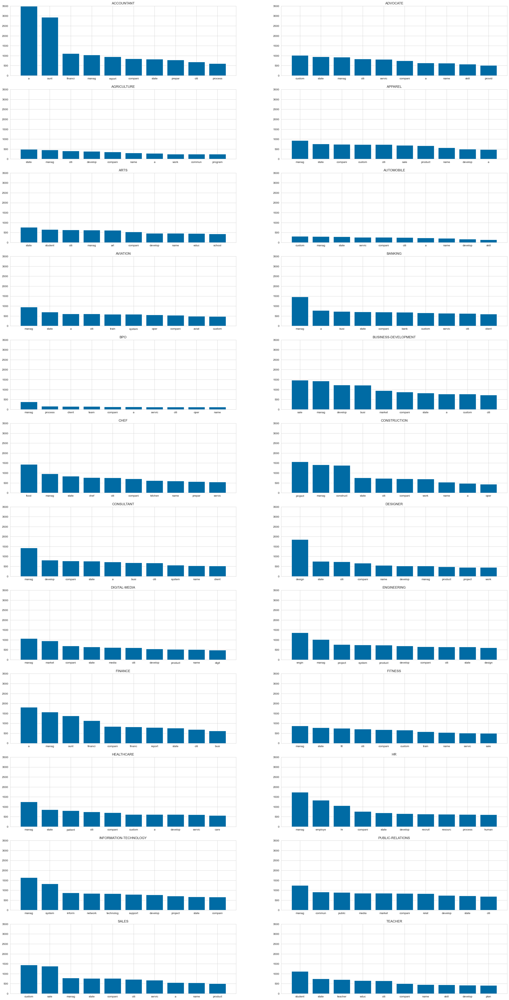

In [25]:
fig = plt.figure(figsize=(32, 64))

for i, category in enumerate(categories):
    wf = wordfreq(df_categories[i])

    fig.add_subplot(12, 2, i + 1).set_title(category)
    plt.bar(wf['Word'], wf['Frequency'])
    plt.ylim(0, 3500)

plt.show()
plt.close()

#Modelling

In [26]:
!pip install spacy

     ---------------------------------------- 12.2/12.2 MB 1.1 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 4.1 MB/s eta 0:00:00
     ---------------------------------------- 46.0/46.0 kB 1.2 MB/s eta 0:00:00
     -------------------------------------- 122.7/122.7 kB 3.6 MB/s eta 0:00:00
     -------------------------------------- 483.8/483.8 kB 3.4 MB/s eta 0:00:00
     -------------------------------------- 181.6/181.6 kB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 50.1/50.1 kB 2.5 MB/s eta 0:00:00
     -------------------------------------- 407.9/407.9 kB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 1.9/1.9 MB 3.9 MB/s eta 0:00:00
     ---------------------------------------- 6.6/6.6 MB 3.6 MB/s eta 0:00:00
     ---------------------------------------- 45.0/45.0 kB 2.3 MB/s eta 0:00:00
  Attempting uninstall: colorama
    Found existing installation: colorama 0.4.5
    Uninstalling colorama-0.4.5:
      Succes

In [27]:
!python -m spacy download en_core_web_sm


     -------------------------------------- 12.8/12.8 MB 605.2 kB/s eta 0:00:00
[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [28]:
import spacy

# Load the English language model
nlp = spacy.load("en_core_web_sm")

In [29]:
def spacy_model(text):
    # Process the text with spaCy
    doc = nlp(text)
    
    # Example: Extract named entities
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    
    # Example: Classify text based on keywords or patterns
    classification = "Unknown"
    keywords = ["data science", "machine learning", "artificial intelligence", "data analysis"]
    for keyword in keywords:
        if keyword in text.lower():
            classification = "Data Science"
            break  # Exit the loop if a keyword is found
    
    return entities, classification


In [30]:
# Apply spaCy modeling function to each resume
df['Spacy_entities'] = df['Resume'].apply(spacy_model)

In [44]:
import spacy

# Load the English language model with custom configurations
nlp = spacy.load("en_core_web_sm", disable=["ner"])  # Disable named entity recognition for now

# Modify pipeline components or hyperparameters as needed
nlp.add_pipe("sentencizer")  # Example: Add a sentencizer component


In [47]:
import spacy
from spacy.matcher import Matcher

# Load the English language model
nlp = spacy.load("en_core_web_sm")

# Define custom patterns for job titles, skills, and education qualifications
job_title_patterns = [[{"POS": "NOUN"}, {"IS_TITLE": True}]]
skill_patterns = [[{"POS": "NOUN"}]]
education_patterns = [[{"LOWER": {"IN": ["bachelor's", "bachelor", "master's", "master", "phd", "degree"]}}, {"POS": "NOUN"}]]

# Initialize Matcher
matcher = Matcher(nlp.vocab)

# Add patterns to the matcher
matcher.add("JOB_TITLE", job_title_patterns)
matcher.add("SKILL", skill_patterns)
matcher.add("EDUCATION", education_patterns)

# Sample resume text
resume_text = "Experienced Data Scientist with a master's degree in Computer Science. Proficient in Python, machine learning, and natural language processing."

# Process the resume text
doc = nlp(resume_text)

# Extract custom entities using the Matcher
matches = matcher(doc)

# Print the extracted entities
for match_id, start, end in matches:
    entity_text = doc[start:end].text
    print("Entity:", entity_text)


Entity: master
Entity: degree
Entity: machine
Entity: learning
Entity: language
Entity: processing


In [49]:
# Split the data into training and testing sets
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Format the data for spaCy
train_data_spacy = [(row['Resume'], row['Category']) for index, row in train_data.iterrows()]
test_data_spacy = [(row['Resume'], row['Category']) for index, row in test_data.iterrows()]

# Print sample data
print("Training Data Sample:")
print(train_data_spacy[:5])

print("\nTesting Data Sample:")
print(test_data_spacy[:5])

Training Data Sample:
[('graduat engin summari intellectu curiou resourc great interperson skill abil commun effect level within organ experi current graduat engin compani name citi state develop conceptu plan two intersect near jersey shore univers medic center base traffic data geometr constraint roadway design standard employ knowledg microst inroad excel vba effici complet miscellan task includ produc report creat visual display gener autom text descript appli vehicl turn softwar autoturn analyz intersect design geometr layout variou project member highway design team direct connect contract project develop grade complex pavement widen section revis vertic horizont align meet njdot standard model highway section use cad microst design softwar inroad gener plan cross section coordin quantiti effort across multipl disciplin highway electr drainag util direct connect contract use hous excel vba program collect organ quantiti data devis addit vba macro optim initi setup print quantiti 

In [59]:
import spacy
import random
from spacy.util import minibatch, compounding
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Format the data for spaCy
train_data_spacy = [(row['Resume'], {'cats': {'category1': 1 if row['Category'] == 'category1' else 0,
                                              'category2': 1 if row['Category'] == 'category2' else 0,
                                              'category3': 1 if row['Category'] == 'category3' else 0}})
                    for index, row in train_data.iterrows()]
test_data_spacy = [(row['Resume'], row['Category']) for index, row in test_data.iterrows()]

# Load the pre-trained English language model
nlp = spacy.blank("en")

# Create the text categorizer
textcat = nlp.create_pipe("textcat")

# Define the categories (resume classes)
resume_categories = ["category1", "category2", "category3"]  # Update with your actual categories

# Add labels to text categorizer
for category in resume_categories:
    textcat.add_label(category)

# Add text categorizer to the pipeline
nlp.add_pipe("textcat", last=True)

# Print sample data
print("Training Data Sample:")
print(train_data_spacy[:5])

print("\nTesting Data Sample:")
print(test_data_spacy[:5])

# Define function to train the model
def train_model(nlp, train_data, epochs=10):
    optimizer = nlp.begin_training()
    losses = {}
    for epoch in range(epochs):
        random.shuffle(train_data)
        # Create batches and iterate over them
        for batch in minibatch(train_data, size=compounding(4.0, 32.0, 1.001)):
            texts, annotations = zip(*batch)
            nlp.update(texts, annotations, sgd=optimizer, drop=0.2, losses=losses)
        print("Epoch:", epoch+1, " Loss:", losses)



Training Data Sample:
[('graduat engin summari intellectu curiou resourc great interperson skill abil commun effect level within organ experi current graduat engin compani name citi state develop conceptu plan two intersect near jersey shore univers medic center base traffic data geometr constraint roadway design standard employ knowledg microst inroad excel vba effici complet miscellan task includ produc report creat visual display gener autom text descript appli vehicl turn softwar autoturn analyz intersect design geometr layout variou project member highway design team direct connect contract project develop grade complex pavement widen section revis vertic horizont align meet njdot standard model highway section use cad microst design softwar inroad gener plan cross section coordin quantiti effort across multipl disciplin highway electr drainag util direct connect contract use hous excel vba program collect organ quantiti data devis addit vba macro optim initi setup print quantiti 

In [ ]:
import spacy
import random
from spacy.util import minibatch, compounding
from sklearn.model_selection import train_test_split
from spacy.training import Example

# Split the data into training and testing sets
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Format the data for spaCy
train_data_spacy = [(row['Resume'], {'cats': {'relevant': row['Category'] == 'relevant'}})
                    for index, row in train_data.iterrows()]
test_data_spacy = [(row['Resume'], {'cats': {'relevant': row['Category'] == 'relevant'}})
                   for index, row in test_data.iterrows()]

# Load the pre-trained English language model
nlp = spacy.blank("en")

# Create the text categorizer
textcat = nlp.add_pipe("textcat")

# Add the binary labels "relevant" and "not_relevant" to the text categorizer
textcat.add_label("relevant")
textcat.add_label("not_relevant")

# Print sample data
print("Training Data Sample:")
print(train_data_spacy[:5])

print("\nTesting Data Sample:")
print(test_data_spacy[:5])

# Define function to train the model
def train_model(nlp, train_data, epochs=10):
    optimizer = nlp.begin_training()
    losses = {}
    for epoch in range(epochs):
        random.shuffle(train_data)
        # Create batches and iterate over them
        for batch in minibatch(train_data, size=compounding(4.0, 32.0, 1.001)):
            examples = []
            for text, annotation in batch:
                examples.append(Example.from_dict(nlp.make_doc(text), annotation))
            nlp.update(examples, sgd=optimizer, drop=0.2, losses=losses)
        print("Epoch:", epoch+1, " Loss:", losses)

# Train the model
train_model(nlp, train_data_spacy)

# Evaluate the model's performance using validation datasets
def evaluate_model(nlp, test_data):
    correct = 0
    total = 0
    for text, annotation in test_data:
        doc = nlp(text)
        predicted_label = doc.cats['relevant'] >= 0.5
        true_label = annotation['cats']['relevant']
        if predicted_label == true_label:
            correct += 1
        total += 1
    accuracy = correct / total
    print("Testing Accuracy:", accuracy)

# Call evaluate_model with your test dataset
evaluate_model(nlp, test_data_spacy)


Training Data Sample:
[('graduat engin summari intellectu curiou resourc great interperson skill abil commun effect level within organ experi current graduat engin compani name citi state develop conceptu plan two intersect near jersey shore univers medic center base traffic data geometr constraint roadway design standard employ knowledg microst inroad excel vba effici complet miscellan task includ produc report creat visual display gener autom text descript appli vehicl turn softwar autoturn analyz intersect design geometr layout variou project member highway design team direct connect contract project develop grade complex pavement widen section revis vertic horizont align meet njdot standard model highway section use cad microst design softwar inroad gener plan cross section coordin quantiti effort across multipl disciplin highway electr drainag util direct connect contract use hous excel vba program collect organ quantiti data devis addit vba macro optim initi setup print quantiti 

Epoch: 1  Loss: {'textcat': 109.25}
Epoch: 2  Loss: {'textcat': 218.5}
Epoch: 3  Loss: {'textcat': 327.75}
Epoch: 4  Loss: {'textcat': 437.0}
Epoch: 5  Loss: {'textcat': 546.25}
Epoch: 6  Loss: {'textcat': 655.5}
Epoch: 7  Loss: {'textcat': 764.75}


In [ ]:
# Call evaluate_model with your test dataset
evaluate_model(nlp, test_data_spacy)